In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
from scipy.signal import convolve2d
import binascii

Setup: we want to embed some invisible text in an image, that can be extracted only by knowing a secret key. 

Here's the watermark embedding procedure:
* We'll go over each pixel in order.
* For each pixel we'll toss a coin: with probability P we'll embed a watermark bit in the current pixel.
* If pixel embedding happens: we toss a second coin, with probability 0.5 we'll flip the sign of the watermark bit to be embedded.

Note that if a cryptographically secure PRNG is used to toss coins, only persons knowing the inital seed of the PRNG can know in which pixel watermark bits were embedded, and which of them were flipped.
<br>
I.e. detecting and recovering the watermark require knowing the PRNG's seed.

We'll use three tricks to make the watermark less visible to the human eye: 
1. Embed watermark bits only in the Blue channel of the image.
2. Embed watermark bits in places of high luminance in the image.
3. Embed watermark bits in places of high frequency in the image (not in plain surfaces etc).

In [3]:
# Helper functions to get bit encoding of text messages

def text_to_bits(text, encoding='utf-8', errors='surrogatepass'):
    bits = bin(int(binascii.hexlify(text.encode(encoding, errors)), 16))[2:]
    return bits.zfill(8 * ((len(bits) + 7) // 8))

def text_from_bits(bits, encoding='utf-8', errors='surrogatepass'):
    n = int(bits, 2)
    return int2bytes(n).decode(encoding, errors)

def int2bytes(i):
    hex_string = '%x' % i
    n = len(hex_string)
    return binascii.unhexlify(hex_string.zfill(n + (n & 1)))

Example of a message and its bit representation, testing the above functions:

In [4]:
message = "Sent to R.E. 12.02.2021"
message_bits = text_to_bits(message)

display(message)
display(message_bits)
display(text_from_bits(message_bits))

'Sent to R.E. 12.02.2021'

'0101001101100101011011100111010000100000011101000110111100100000010100100010111001000101001011100010000000110001001100100010111000110000001100100010111000110010001100000011001000110001'

'Sent to R.E. 12.02.2021'

### Loading an image and embedding this message in it:

In [5]:
im = Image.open('image.jpg')
arr = np.array(im) / 255

# computing image luminance from rgb values
# will be used to weight intensity of watermark bit embedding:
# high lumiance -> ok to embed a bit with higher intensity
luminance_rgb_fact = np.array([0.2126, 0.7152, 0.0722])
image_luminance = arr @ luminance_rgb_fact

# initializing the watermark with zeros
watermark = np.zeros(image_luminance.shape)

# proba that each pixel contains an embedded watermark bit
# set =1 for max intensity
emb_prob = 0.4
# used to reduce the overall intensity and visibilty 
# of the watermark (set =1 for max intensity)
emb_intensity = 0.4

# secret key: for real stuff should be a real secret, and np.random should not be used
seed = 42
np.random.seed(seed)

In [6]:
ix = 0

# going over each pixel of the blue channel
for i in range(image_luminance.shape[0]):
    for j in range(image_luminance.shape[1]):
        
        # tossing a coin: are we embedding a watermark bit?
        rn = np.random.uniform()
        
        # embedding a watermark bit
        if rn <= emb_prob :
            
            # getting next bit to encode from the watermark
            bit_to_embed = message_bits[ix % len(message_bits)]
            
            # mapping from {0,1} to {-1,1} to keep overall image luminance similar
            bit_to_embed = int(bit_to_embed) * 2 - 1
            
            # tossing second coin: do we flip the watermark bit?
            random_flip = np.random.randint(0,2) * 2 - 1
            bit_to_embed *= random_flip
            
            watermark[i,j] = bit_to_embed * image_luminance[i,j] 
            ix += 1

In [7]:
# adding the watermark to the blue chan of the image:
watermarked_image = np.copy(arr)
watermarked_image[:,:,2] += (watermark * emb_intensity)

# converting back to uint8 for displaying and saving:
watermarked_image *= 255
watermarked_image = np.uint8(watermarked_image.clip(min=0,max=255))

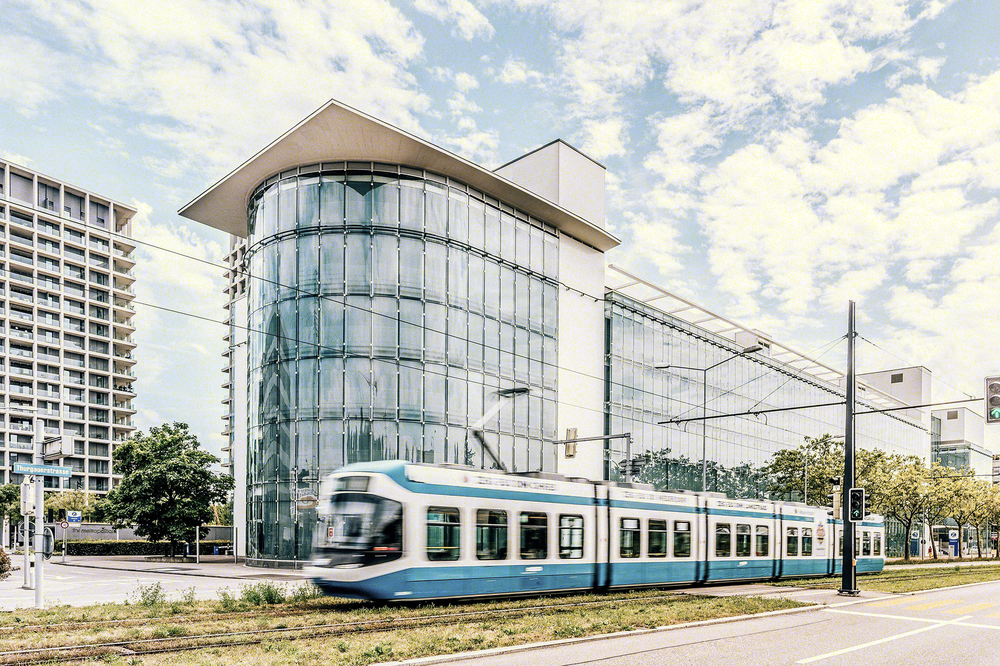

In [8]:
Image.fromarray(watermarked_image)

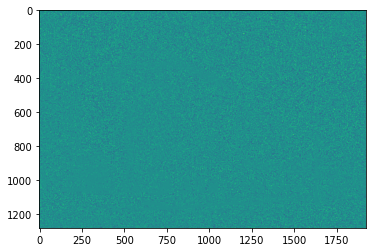

In [9]:
plt.imshow(watermark)

In [10]:
quality = 75 # lossless compression = 100, 75 is default
Image.fromarray(watermarked_image).save('watermarked.jpg', quality = quality)

### Extracting the watermark from the image

Let's assume that we don't have access to the initial image. We need to extract the watermark only from the watermarked image and the secret key. <br>


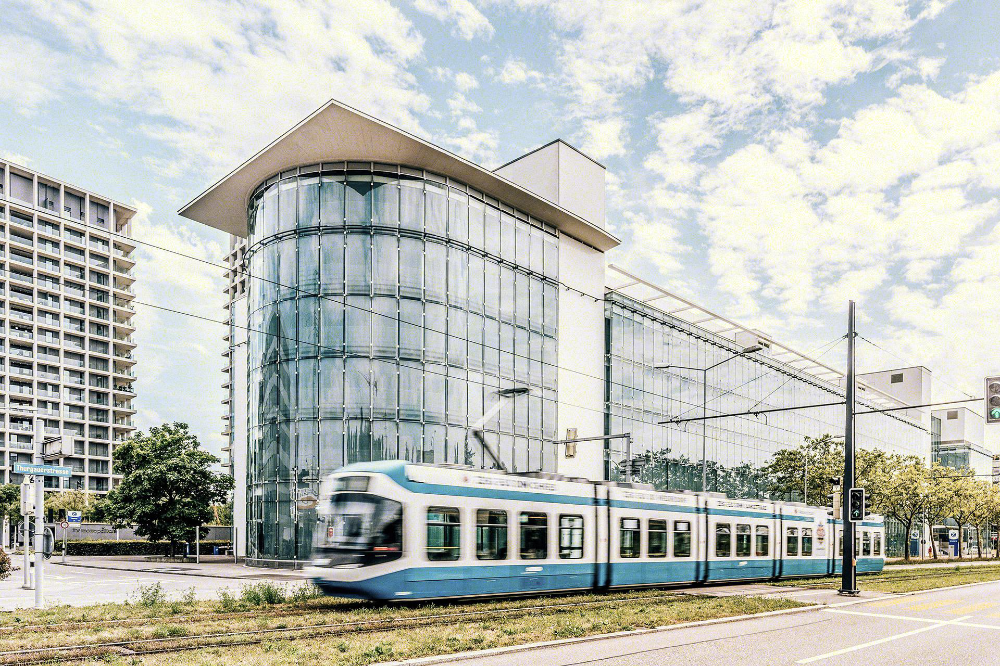

In [11]:
watermarked = Image.open('watermarked.jpg')
watermarked

In [12]:
watermarked = np.array(watermarked) / 255
blue_chan = watermarked[:,:,2]

watermark = np.zeros((watermarked.shape[0], watermarked.shape[1]))

IRL most pixels close from each other spatially take similar values. But the watermark added to the image doesn't have this property. So we can estimate the watermark by, for each pixel value, subtracting the average values of its neighbors.
<br>
<br>
Let's do that by convolving the image with such a kernel, for example:

In [13]:
ker_size = 5
ker = np.ones((ker_size,ker_size))
ker /= -ker.sum()
ker[ker_size//2,ker_size//2] = 1
ker

array([[-0.04, -0.04, -0.04, -0.04, -0.04],
       [-0.04, -0.04, -0.04, -0.04, -0.04],
       [-0.04, -0.04,  1.  , -0.04, -0.04],
       [-0.04, -0.04, -0.04, -0.04, -0.04],
       [-0.04, -0.04, -0.04, -0.04, -0.04]])

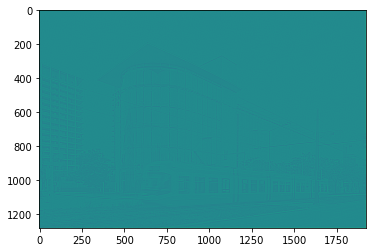

In [14]:
# estimated watermark
watermark = convolve2d(blue_chan, ker, 'same')
plt.imshow(watermark)

Now we need to decrypt the watermark's information, selecting the right pixels and flipping bits where appropriate 

In [14]:
np.random.seed(seed)

In [15]:
ix = 0
dec_message = []
for i in range(watermark.shape[0]):
    for j in range(watermark.shape[1]):
        
        rn = np.random.uniform()
        # watermark bit was embedded
        if rn <= emb_prob :
            
            diff = watermark[i,j]
            
            # generating random key for this bit, in {-1,1}
            random_key = np.random.randint(0,2) * 2 - 1
            
            diff *= random_key
            
            dec_message.append(diff)
dec = np.array(dec_message)

Now we have decrypted the message's bits (identified pixels in which watermark was embedded, and bits that were flipped) we need to decode its bits to text.

1st step is to estimate the message length. Let's assume that the message has more than 5 letters, and is repeated at least 1.5x over the entire image, for decoding ease.
<br>
For each possible message length, we'll try to see how clean the message is. And we'll pick the message length that gives the clearest decoding:

In [16]:
likely_mess_size = {}
# 5 letters, to message being repeated at least 1.5x
for n_letters in range(5, int(len(dec) * emb_prob / (8 * 1.5))):
    ms_len = n_letters * 8
    if len(dec) % ms_len == 0:
        temp_dec = dec.reshape(-1, ms_len)
    else:
        temp_dec = dec[:-(dec.shape[0] % ms_len)].reshape(-1, ms_len)
    fac = temp_dec.sum(axis = 0)
    fac = np.abs(fac).min() / np.abs(fac).max()
    #fac = (temp_dec @ temp_dec.T).min() / (temp_dec @ temp_dec.T).max()
    likely_mess_size[n_letters] = fac 

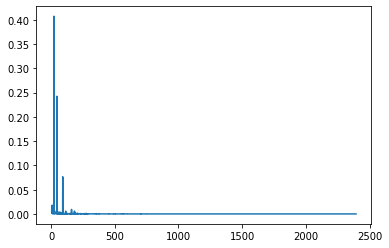

In [17]:
plt.plot(list(likely_mess_size.keys()),list(likely_mess_size.values()))

In [18]:
mess_size = sorted(likely_mess_size.items(), key = lambda x: x[1])[-1][0] * 8

if len(dec) % mess_size == 0:
    decoding = dec.reshape(-1, mess_size)
else:
    decoding = dec[:-(dec.shape[0] % mess_size)].reshape(-1, mess_size)
    
decoding = decoding.sum(axis = 0)
decoding = np.sign(decoding)
decoding = (decoding + 1) / 2

In [19]:
decoded_message = ''.join([str(int(i)) for i in decoding])

In [20]:
text_from_bits(decoded_message)

'Sent to R.E. 12.02.2021'

If message doesn't decode properly, the estimated watermark was too noisy. Can be countered by:
* Embedding the watermark with higher proba 'emb_prob'
* Embedding the watermark with higher intensity 'emb_intensity'
* Saving the image with a higher quality
* Lowering the message size: the watermark is repeated on the entire image. The fewer bits in the watermark, the higher number of time they will be repeated in the image, and the higher the probability to decode them corretly. 